In [3]:
# import warnings
# warnings.filterwarnings('ignore')
import torch
import torch.nn as nn
import torch.nn.functional as F

### Forward Diffusion

In [35]:
# Number of noice/denoice steps
t = 500
# t = 250

In [36]:

beta_st = 1e-4
betas = torch.linspace(start=beta_st, end=0.02, steps=t)

betas

tensor([1.0000e-04, 1.3988e-04, 1.7976e-04, 2.1964e-04, 2.5952e-04, 2.9940e-04,
        3.3928e-04, 3.7916e-04, 4.1904e-04, 4.5892e-04, 4.9880e-04, 5.3868e-04,
        5.7856e-04, 6.1844e-04, 6.5832e-04, 6.9820e-04, 7.3808e-04, 7.7796e-04,
        8.1784e-04, 8.5772e-04, 8.9760e-04, 9.3747e-04, 9.7735e-04, 1.0172e-03,
        1.0571e-03, 1.0970e-03, 1.1369e-03, 1.1768e-03, 1.2166e-03, 1.2565e-03,
        1.2964e-03, 1.3363e-03, 1.3762e-03, 1.4160e-03, 1.4559e-03, 1.4958e-03,
        1.5357e-03, 1.5756e-03, 1.6154e-03, 1.6553e-03, 1.6952e-03, 1.7351e-03,
        1.7749e-03, 1.8148e-03, 1.8547e-03, 1.8946e-03, 1.9345e-03, 1.9743e-03,
        2.0142e-03, 2.0541e-03, 2.0940e-03, 2.1339e-03, 2.1737e-03, 2.2136e-03,
        2.2535e-03, 2.2934e-03, 2.3333e-03, 2.3731e-03, 2.4130e-03, 2.4529e-03,
        2.4928e-03, 2.5327e-03, 2.5725e-03, 2.6124e-03, 2.6523e-03, 2.6922e-03,
        2.7321e-03, 2.7719e-03, 2.8118e-03, 2.8517e-03, 2.8916e-03, 2.9315e-03,
        2.9713e-03, 3.0112e-03, 3.0511e-

In [37]:
alphas = 1 - betas

alphas

tensor([0.9999, 0.9999, 0.9998, 0.9998, 0.9997, 0.9997, 0.9997, 0.9996, 0.9996,
        0.9995, 0.9995, 0.9995, 0.9994, 0.9994, 0.9993, 0.9993, 0.9993, 0.9992,
        0.9992, 0.9991, 0.9991, 0.9991, 0.9990, 0.9990, 0.9989, 0.9989, 0.9989,
        0.9988, 0.9988, 0.9987, 0.9987, 0.9987, 0.9986, 0.9986, 0.9985, 0.9985,
        0.9985, 0.9984, 0.9984, 0.9983, 0.9983, 0.9983, 0.9982, 0.9982, 0.9981,
        0.9981, 0.9981, 0.9980, 0.9980, 0.9979, 0.9979, 0.9979, 0.9978, 0.9978,
        0.9977, 0.9977, 0.9977, 0.9976, 0.9976, 0.9975, 0.9975, 0.9975, 0.9974,
        0.9974, 0.9973, 0.9973, 0.9973, 0.9972, 0.9972, 0.9971, 0.9971, 0.9971,
        0.9970, 0.9970, 0.9969, 0.9969, 0.9969, 0.9968, 0.9968, 0.9967, 0.9967,
        0.9967, 0.9966, 0.9966, 0.9966, 0.9965, 0.9965, 0.9964, 0.9964, 0.9964,
        0.9963, 0.9963, 0.9962, 0.9962, 0.9962, 0.9961, 0.9961, 0.9960, 0.9960,
        0.9960, 0.9959, 0.9959, 0.9958, 0.9958, 0.9958, 0.9957, 0.9957, 0.9956,
        0.9956, 0.9956, 0.9955, 0.9955, 

In [38]:
cum_alphas = torch.cumprod(alphas, dim=-1)
cum_alphas

tensor([0.9999, 0.9998, 0.9996, 0.9994, 0.9991, 0.9988, 0.9985, 0.9981, 0.9977,
        0.9972, 0.9967, 0.9962, 0.9956, 0.9950, 0.9943, 0.9936, 0.9929, 0.9921,
        0.9913, 0.9905, 0.9896, 0.9886, 0.9877, 0.9867, 0.9856, 0.9846, 0.9834,
        0.9823, 0.9811, 0.9798, 0.9786, 0.9773, 0.9759, 0.9745, 0.9731, 0.9717,
        0.9702, 0.9686, 0.9671, 0.9655, 0.9638, 0.9622, 0.9605, 0.9587, 0.9569,
        0.9551, 0.9533, 0.9514, 0.9495, 0.9475, 0.9456, 0.9435, 0.9415, 0.9394,
        0.9373, 0.9351, 0.9330, 0.9307, 0.9285, 0.9262, 0.9239, 0.9216, 0.9192,
        0.9168, 0.9144, 0.9119, 0.9094, 0.9069, 0.9043, 0.9018, 0.8992, 0.8965,
        0.8939, 0.8912, 0.8884, 0.8857, 0.8829, 0.8801, 0.8773, 0.8744, 0.8716,
        0.8687, 0.8657, 0.8628, 0.8598, 0.8568, 0.8538, 0.8507, 0.8477, 0.8446,
        0.8415, 0.8383, 0.8352, 0.8320, 0.8288, 0.8256, 0.8223, 0.8190, 0.8158,
        0.8125, 0.8091, 0.8058, 0.8024, 0.7991, 0.7957, 0.7923, 0.7888, 0.7854,
        0.7819, 0.7784, 0.7750, 0.7714, 

In [39]:
sq_cum_alphas = torch.sqrt(cum_alphas)
one_minus_sq_cum_alphas = torch.sqrt((1 - cum_alphas))

In [40]:
sq_cum_alphas

tensor([0.9999, 0.9999, 0.9998, 0.9997, 0.9996, 0.9994, 0.9992, 0.9990, 0.9988,
        0.9986, 0.9984, 0.9981, 0.9978, 0.9975, 0.9972, 0.9968, 0.9964, 0.9961,
        0.9956, 0.9952, 0.9948, 0.9943, 0.9938, 0.9933, 0.9928, 0.9922, 0.9917,
        0.9911, 0.9905, 0.9899, 0.9892, 0.9886, 0.9879, 0.9872, 0.9865, 0.9857,
        0.9850, 0.9842, 0.9834, 0.9826, 0.9818, 0.9809, 0.9800, 0.9791, 0.9782,
        0.9773, 0.9764, 0.9754, 0.9744, 0.9734, 0.9724, 0.9714, 0.9703, 0.9692,
        0.9681, 0.9670, 0.9659, 0.9647, 0.9636, 0.9624, 0.9612, 0.9600, 0.9587,
        0.9575, 0.9562, 0.9549, 0.9536, 0.9523, 0.9510, 0.9496, 0.9482, 0.9468,
        0.9454, 0.9440, 0.9426, 0.9411, 0.9396, 0.9381, 0.9366, 0.9351, 0.9336,
        0.9320, 0.9304, 0.9289, 0.9273, 0.9256, 0.9240, 0.9224, 0.9207, 0.9190,
        0.9173, 0.9156, 0.9139, 0.9121, 0.9104, 0.9086, 0.9068, 0.9050, 0.9032,
        0.9014, 0.8995, 0.8977, 0.8958, 0.8939, 0.8920, 0.8901, 0.8882, 0.8862,
        0.8843, 0.8823, 0.8803, 0.8783, 

In [34]:
one_minus_sq_cum_alphas

tensor([0.0100, 0.0167, 0.0232, 0.0297, 0.0360, 0.0424, 0.0487, 0.0551, 0.0614,
        0.0677, 0.0740, 0.0803, 0.0866, 0.0929, 0.0992, 0.1055, 0.1118, 0.1181,
        0.1243, 0.1306, 0.1368, 0.1430, 0.1493, 0.1555, 0.1617, 0.1679, 0.1741,
        0.1803, 0.1864, 0.1926, 0.1987, 0.2049, 0.2110, 0.2171, 0.2232, 0.2293,
        0.2354, 0.2414, 0.2475, 0.2535, 0.2595, 0.2655, 0.2715, 0.2774, 0.2834,
        0.2893, 0.2953, 0.3012, 0.3070, 0.3129, 0.3188, 0.3246, 0.3304, 0.3362,
        0.3420, 0.3477, 0.3535, 0.3592, 0.3649, 0.3706, 0.3762, 0.3818, 0.3875,
        0.3930, 0.3986, 0.4042, 0.4097, 0.4152, 0.4207, 0.4261, 0.4316, 0.4370,
        0.4424, 0.4477, 0.4531, 0.4584, 0.4637, 0.4689, 0.4742, 0.4794, 0.4846,
        0.4897, 0.4949, 0.5000, 0.5051, 0.5101, 0.5152, 0.5202, 0.5251, 0.5301,
        0.5350, 0.5399, 0.5448, 0.5496, 0.5544, 0.5592, 0.5640, 0.5687, 0.5734,
        0.5781, 0.5827, 0.5873, 0.5919, 0.5965, 0.6010, 0.6055, 0.6099, 0.6144,
        0.6188, 0.6232, 0.6275, 0.6318, 

In [9]:
def forward_pass(img, timestep):
    sq_alpha = sq_cum_alphas[timestep]
    one_minus_sq_alpha = one_minus_sq_cum_alphas[timestep]
    return sq_alpha * img + one_minus_sq_alpha * torch.randn_like(img)
    

In [10]:
# full forward pass

# Number of noice/denoice steps
t = 1000

beta_st = 1e-4
betas = torch.linspace(start=beta_st, end=0.02, steps=t)

alphas = 1 - betas
cum_alphas = torch.cumprod(alphas, dim=-1)

sq_cum_alphas = torch.sqrt(cum_alphas)
one_minus_sq_cum_alphas = torch.sqrt((1 - cum_alphas))


def forward_pass(img, timestep):
    sq_alpha = sq_cum_alphas[timestep]
    one_minus_sq_alpha = one_minus_sq_cum_alphas[timestep]
    return sq_alpha * img + one_minus_sq_alpha * torch.randn_like(img)
    





In [11]:
# Download a sample image from the internet (32x32 for simplicity)
import urllib.request
from PIL import Image
import torchvision.transforms as transforms

# URL for a sample image (random 32x32 image from Lorem Picsum)
url = "https://images.squarespace-cdn.com/content/v1/5d39a82243494b0001b83080/1569442869330-USNOM1FL9ATLFAQLUR8D/resting_cat_ts_481099188.jpg"
urllib.request.urlretrieve(url, "sample_image.jpg")



('sample_image.jpg', <http.client.HTTPMessage at 0x739483c749d0>)

In [12]:
# Load the image
img = Image.open("sample_image.jpg")
transform = transforms.ToTensor()  # Converts to tensor and scales to [0,1]
img_tensor = transform(img)
print("Downloaded image shape:", img_tensor.shape)  # Should be (3, 32, 32) for RGB

Downloaded image shape: torch.Size([3, 1667, 2500])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.5635796..5.6325154].


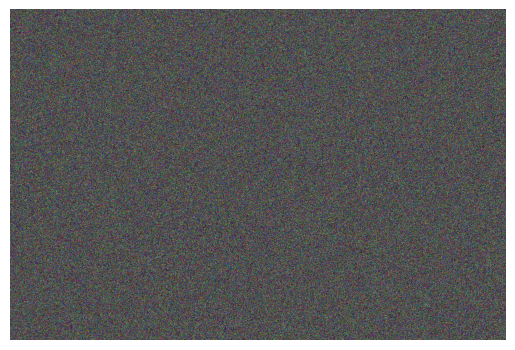

In [13]:
import matplotlib.pyplot as plt


# Test forward diffusion at timestep 100
timestep = 999
noisy_img = forward_pass(img_tensor, timestep)

# img_tensor is in (C, H, W) format, permute to (H, W, C) for visualization
img = noisy_img.permute(1, 2, 0).numpy()
plt.imshow(img)
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.041161213..1.030515].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6684424..2.2605133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8407967..3.9854379].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.8972187..4.646988].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.2433505..5.2648687].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.223627..5.276479].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.169833..

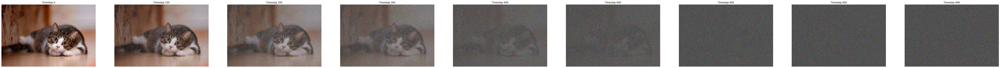

In [14]:
# showing each timestep images in a row
fig, axes = plt.subplots(1, 9, figsize=(90, 100))
timesteps = [0, 100, 200, 300, 499, 600, 800, 900, 999]
for ax, t in zip(axes, timesteps):
    noisy_img = forward_pass(img_tensor, t)
    img = noisy_img.permute(1, 2, 0).numpy()
    ax.imshow(img)
    ax.set_title(f"Timestep {t}")
    ax.axis('off')
plt.show()

In [15]:
timestep

999

In [16]:
## Sampling from the reverse process (denoising)
def sampling(num=1):
    
    noisy_img = torch.randn((num, 3, 32, 32))  # Start with pure noise
    curr_noisy_img = noisy_img
    for t in range(timestep, -1, -1):
        noise_pred = diffusion_model(curr_noisy_img, t)
        alpha = alphas[t] # Get the pure alpha for the current timestep
        sq_alpha = torch.sqrt(alpha) # Square root of the pure alpha
    
        xt_1 = (1/sq_alpha) * (curr_noisy_img - (((1 - alpha) / one_minus_sq_cum_alphas[t])) * model_output) + (0.1 * torch.randn_like(curr_noisy_img) if t > 0 else 0)
        
        curr_noisy_img = xt_1
    return xt_1


In [17]:
class Diffusion:
    def __init__(self, timesteps, betas_start, betas_ends, img_size):
        self.img_size = img_size
        self.timesteps = timesteps
        self.betas = torch.linspace(betas_start, betas_ends, timesteps)
        self.alphas = 1 - self.betas
        self.cum_alphas = torch.cumprod(self.alphas, dim=-1)
        self.sqrt_cum_alphas = torch.sqrt(self.cum_alphas)
        self.sqrt_one_minus_cum_alphas = torch.sqrt(1 - self.cum_alphas)
    
    def forward_pass(self, img: torch.Tensor, timesteps: torch.Tensor):
        sqrt_cum_alpha = self.sqrt_cum_alphas[timesteps]
        sqrt_one_minus_cum_alpha = self.sqrt_one_minus_cum_alphas[timesteps]
        
        # broad cast for each batch, since each batch have different alphas
        sqrt_cum_alpha = sqrt_cum_alpha.view(-1, 1, 1, 1)
        sqrt_one_minus_cum_alpha = sqrt_one_minus_cum_alpha.view(-1, 1, 1, 1)
        
        noise = torch.randn_like(img)
        
        x_t = sqrt_cum_alpha * img + sqrt_one_minus_cum_alpha * noise
        
        return x_t, noise
    
    def sampling(self, num=1):
        xt = torch.randn(num, 3, self.img_size, self.img_size)
        
        for t in range(self.timesteps -1, -1, -1):
            noise_pred = diffusion_model(xt, t)
            alpha = self.alphas[t] # Get the pure alpha for the current timestep
            sq_alpha = torch.sqrt(alpha) # Square root of the pure alpha
            xt = (1/sq_alpha) * (xt - (((1 - alpha) / self.sqrt_one_minus_cum_alphas[t]) * noise_pred)) + (torch.sqrt(self.betas[t]) * torch.randn_like(noise_pred) if t > 0 else 0)
            
        return xt
        
        

In [18]:
torch.mps.is_available()

False

In [19]:
# class DoubleConv(nn.Module):
#     def __init__(self, in_channels, out_channels, is_residual=False):
#         super().__init__()
#         self.is_residual = is_residual
#         self.net = nn.Sequential(
#             nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1, stride=1),
#             nn.GroupNorm(2, num_channels=out_channels),
#             nn.GELU(),
#             nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding=1, stride=1),
#         )
#         self.norm = nn.GroupNorm(2, num_channels=out_channels)
        
#     def forward(self, x: torch.Tensor):
#         if self.is_residual:
#             residual_x = x
#             x = residual_x + self.net(x)
#             x = self.norm(x)
#             return F.gelu(x)
#         else:
#             x = self.net(x)
#             x = self.norm(x)
#             return F.gelu(x)
        
    
    
# test = torch.randn(1, 3, 512, 512)
# DoubleConv(in_channels=3, out_channels=32)(test).size()

In [20]:
# class Down(nn.Module):
#     def __init__(self, in_channels, out_channels, t_embed_dim):
#         super().__init__()
#         self.net = nn.Sequential(
#             nn.MaxPool2d(2),
#             DoubleConv(in_channels=in_channels, out_channels=in_channels, is_residual=True),
#             DoubleConv(in_channels=in_channels, out_channels=in_channels, is_residual=True),
#             DoubleConv(in_channels=in_channels, out_channels=out_channels, is_residual=False)
#         )
        
#         # self.embed_proj = nn.Sequential(
#         #     nn.Linear(t_embed_dim, in_channels, bias=False),
#         #     nn.SiLU()
#         # )
        
#         self.norm = nn.GroupNorm(2, num_channels=in_channels)
    
#     def forward(self, x, t_emb):
#         # time_emb_proj = self.embed_proj(t_emb)[:, :, None, None]
#         x += t_emb
#         x = self.norm(x)
#         x = self.net(x)
#         return x

    
# test = torch.randn(2, 32, 512, 512)
# t_emb = torch.rand(2, 256)
# Down(in_channels=32, out_channels=32, t_embed_dim=256)(test, t_emb).size()

In [21]:

class SelfAttention(nn.Module):
    def __init__(self, in_channels, mlp_ratio=4):
        super().__init__()
        self.pre_norm = nn.LayerNorm(in_channels)
        self.attn_layer = nn.MultiheadAttention(embed_dim=in_channels,num_heads=4, batch_first=True)
        self.norm1 = nn.LayerNorm(in_channels)
        self.mlp = nn.Sequential(
            nn.Linear(in_features=in_channels, out_features=in_channels*mlp_ratio),
            nn.GELU(),
            nn.Linear(in_features=in_channels*mlp_ratio, out_features=in_channels),
        )
        self.norm2 = nn.LayerNorm(in_channels)
        
    def forward(self, x: torch.Tensor):
        n_batch, channels, width, height = x.size()
        # flatten each img channel to 1d
        x = x.view(n_batch, channels, width*height)
        # img_pixels in horizontal -> channel pixels in horizontal [1st channel pixel 1 , 2nd ch pix 2]
        x = x.transpose(1, 2) # b, imgsize, channels
        norm_x = self.pre_norm(x)
        
        residual_x = x        
        attn_out, _ = self.attn_layer(norm_x, norm_x, norm_x, need_weights=False)
        x = residual_x + attn_out
        x = self.norm1(x)
        
        residual_x = x
        mlp_out = self.mlp(x)
        x = residual_x + mlp_out
        x = self.norm2(x)
        
        return x.transpose(1, 2).contiguous().view(n_batch, channels, width, height)

test = torch.randn(2, 32, 64, 64)
SelfAttention(in_channels=32, mlp_ratio=4)(test).size()

torch.Size([2, 32, 64, 64])

In [22]:

# class Up(nn.Module):
#     def __init__(self, in_channels, out_channels, t_embed_dim) -> None:
#         super().__init__()
#         self.up_sample = nn.Upsample(scale_factor=2)
#         self.up_net = nn.Sequential(
#             DoubleConv(in_channels=in_channels, out_channels=in_channels, is_residual=True),
#             DoubleConv(in_channels=in_channels, out_channels=in_channels, is_residual=True),
#             DoubleConv(in_channels=in_channels, out_channels=out_channels, is_residual=False),
#         )
        
#         self.embed_proj = nn.Sequential(
#             nn.Linear(t_embed_dim, in_channels, bias=False),
#             nn.SiLU()
#         )
        
#         self.norm = nn.GroupNorm(2, num_channels=in_channels)
        
#     def forward(self, x: torch.Tensor, x_skip, t):
#         x = self.up_sample(x)
#         x = torch.concat([x, x_skip], dim=1)
#         t_proj = self.embed_proj(t)[:, :, None, None]
#         x += t_proj
#         x = self.norm(x)
#         return self.up_net(x)
    

# test = torch.randn(2, 32, 256, 256)
# xskip = torch.randn(2, 32, 512, 512)
# t_emb = torch.rand(2, 256)
# Up(in_channels=32*2, out_channels=32, t_embed_dim=256)(test, xskip, t_emb).size()

In [23]:
# class Unet(nn.Module):
#     def __init__(self, img_channels=3, channels=[64, 128, 256, 512, 1024], t_embed_dim=256):
#         super().__init__()
        
#         self.initial_layer = DoubleConvLayer(in_channels=img_channels, out_channels=channels[0])
#         self.down_layers = nn.ModuleList(
#             [DownLayer(in_channels=channels[i], out_channels=channels[i+1], t_embed_dim=t_embed_dim) for i in range(len(channels)-1)]
#         )
        
#         self.middle_layer = DoubleConvLayer(in_channels=channels[-1], out_channels=channels[-2], is_residual=False)
        
#         reversed_channels = list(reversed(channels))[1: ] # we don't need last number 1024
        
#         self.up_layers = nn.ModuleList(
#             [UpLayer(in_channels=reversed_channels[i]*2, out_channels=reversed_channels[i+1], t_embed_dim=t_embed_dim) for i in range(len(reversed_channels)-1)]
#         )
        
#         self.up_layers.append(UpLayer(in_channels=channels[0]*2, out_channels=channels[0], t_embed_dim=t_embed_dim)) # this for last row which won't reach with only loop, loop end before it since we skip 1024 and added it in downlayer
        
#         self.final_layer = nn.Sequential(
#             nn.Conv2d(in_channels=channels[0], out_channels=channels[0], kernel_size=3, padding=1, stride=1),
#             nn.GroupNorm(2, num_channels=channels[0]),
#             nn.GELU(),
#             nn.Conv2d(in_channels=channels[0], out_channels=img_channels, kernel_size=1, stride=1),
#             nn.Tanh()
#         )
        
#     def forward(self, x: torch.Tensor, t_emb: torch.Tensor):
#         down_outputs = []
#         x = self.initial_layer(x)
#         down_outputs.append(x)
        
#         # down layers
#         for down_module in self.down_layers:
#             x = down_module(x, t_emb)
#             down_outputs.append(x)
        
#         # remove last down output since it won't need for skip connection
#         down_outputs.pop()
        
#         x = self.middle_layer(x)
        
#         print(f"After down{x.size()}")
        
#         for up_module in self.up_layers:
#             down_x = down_outputs.pop()
#             x = up_module(x, down_x, t_emb)
            
#         print(len(down_outputs), x.size(), "haooo")
            
#         return self.final_layer(x)


# test = torch.randn(1, 3, 512, 512)
# t_emb = torch.rand(1, 128)
# Unet(img_channels=3, t_embed_dim=128)(test, t_emb).size()

In [24]:
# channels = [1, 2, 3]
# list(reversed(channels))

In [25]:
# OLD
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch, residual=False):
        super().__init__()
        self.residual = residual
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels=in_ch, out_channels=out_ch, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(2, out_ch),
            nn.GELU(),
            nn.Conv2d(in_channels=out_ch, out_channels=out_ch, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(2, out_ch)
        )
        
        self.norm = nn.GroupNorm(2, out_ch)

    def forward(self, x):
        if self.residual:
            return F.gelu(self.norm(x + self.double_conv(x)))
        else:
            return F.gelu(self.double_conv(x))

In [26]:
# OLD

# class SelfAttention(nn.Module):
#     def __init__(self, channel_dim) -> None:
#         super().__init__()
#         # self.size = size
#         self.channel_dim = channel_dim 
#         self.mha = nn.MultiheadAttention(channel_dim, num_heads=4)
#         self.norm = nn.LayerNorm(channel_dim)
#         self.final_layer = nn.Sequential(
#             nn.LayerNorm(channel_dim),
#             nn.Linear(channel_dim, channel_dim),
#             nn.LayerNorm(channel_dim),
#             nn.GELU(),
#             nn.Linear(channel_dim, channel_dim)
#         )

#     def forward(self, x: torch.Tensor):
#         size = x.shape[-1]
#         x = x.view(-1, self.channel_dim, size * size).transpose(1, 2) # num, channel, siz*siz -> num, siz*siz, channel
#         norm_x = self.norm(x)
#         attn_x, _= self.mha(norm_x, norm_x, norm_x)
#         attn_x = attn_x + x
#         x = self.final_layer(attn_x) + attn_x
#         return x.transpose(1, 2).contiguous().view(-1, self.channel_dim, size, size)

In [27]:
## OLD

class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        self.max_pool = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_ch=in_channels, out_ch=in_channels, residual=True),
            DoubleConv(in_ch=in_channels, out_ch=in_channels, residual=True),
            DoubleConv(in_ch=in_channels, out_ch=out_channels, residual=False)
            )
        
        self.embed_layer = nn.Sequential( # a projection Layer to feature maps dim , [b, embed_dim] -> [b, channels_dim] so each channel will get scalar pos info
            nn.Linear(emb_dim, out_channels),
            nn.SiLU(),
        )
        
        self.norm = nn.GroupNorm(2, out_channels)
        
    def forward(self, x, t):
        x = self.max_pool(x)
        emb = self.embed_layer(t)[:, :, None, None] #.repeat(1, 1, x.shape[-2], x.shape[-1])
        return self.norm(x + emb) # each channel will get seperate pos number that get added

In [28]:
# OLDER
class Up(nn.Module):
    def __init__(self, in_channel, out_channel, emb_dim=256) -> None:
        super().__init__()

        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv = nn.Sequential(
            DoubleConv(in_ch=in_channel, out_ch=in_channel),
            DoubleConv(in_ch=in_channel, out_ch=out_channel),
            DoubleConv(in_ch=out_channel, out_ch=out_channel)
        )

        self.emb_layer = nn.Linear(in_features=emb_dim, out_features=out_channel)
        
        self.norm = nn.GroupNorm(2, out_channel)

    def forward(self, x, x_skip, t_emb):
        x = self.up(x)
        x = torch.concat([x_skip, x], dim=1)
        x = self.conv(x)
        t_emb = self.emb_layer(t_emb)[:, :, None, None]
        return self.norm(x + t_emb)

In [29]:
class UNet(nn.Module):
    def __init__(self, c_in=3, c_out=3, time_dim=256, device='cuda') -> None:
        super().__init__()
        self.device = device
        self.time_dim = time_dim

        self.inc = DoubleConv(c_in, 64)

        self.down1 = Down(64, 128)
        self.sa1 = SelfAttention(128)

        self.down2 = Down(128, 256)
        self.sa2 = SelfAttention(256)

        self.down3 = Down(256, 256)
        self.sa3 = SelfAttention(256)

        self.bot1 = DoubleConv(256, 512)
        self.bot2 = DoubleConv(512, 512)
        self.bot3 = DoubleConv(512, 256)

        self.up1 = Up(512, 128) # 512 cuz we have 256 skip connection
        self.sa4 = SelfAttention(128)

        self.up2 = Up(256, 64) # 126 skip
        self.sa5 = SelfAttention(64)

        self.up3 = Up(128, 64)
        self.sa6 = SelfAttention(64)

        self.outc = nn.Conv2d(64, c_out, kernel_size=1) # 1x1


    def pos_encoding(self, t, channel):
        inv_freq = 1 / (10000 ** (torch.arange(0, channel, 2, device=self.device).float() / channel))
        pos_enc_a = torch.sin(t.repeat(1, channel // 2) * inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channel // 2) * inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc.to(self.device)
    
    def forward(self, x, t):
        t = t.float().unsqueeze(-1)
        t_emb = self.pos_encoding(t, self.time_dim)

        x1 = self.inc(x) # (b, 3, 64, 64) -> (b, 64, 64, 64)

        x2 = self.down1(x1, t_emb) # 64 -> 32
        x2 = self.sa1(x2) # 32 -> 32

        x3 = self.down2(x2, t_emb) # 32 -> 16
        x3 = self.sa2(x3) # 16 -> 16

        x4 = self.down3(x3, t_emb) # 16 -> 8
        x4 = self.sa3(x4) # 8 -> 8


        x4 = self.bot1(x4) # 8
        x4 = self.bot2(x4) # 8

        x4 = self.bot3(x4) 

        x = self.up1(x4, x3, t_emb) # 8 -> 16
        x = self.sa4(x) 


        x = self.up2(x, x2, t_emb) # 16 -> 32
        x = self.sa5(x) # 32


        x = self.up3(x, x1, t_emb) # 32 -> 64
        x = self.sa6(x) # 64


        output = self.outc(x) # 1x1

        return output
    
test = torch.randn(1, 3, 64, 64)
t = torch.tensor(5)
UNet(device='cpu')(test, t).size()

torch.Size([1, 3, 64, 64])

In [30]:

test = torch.randn(8, 32, 64, 64)
SelfAttention(32)(test).size()

torch.Size([8, 32, 64, 64])

In [31]:
%%time
class AttentionLayer(nn.Module):
    def __init__(self, in_channels, mlp_ratio=4):
        super().__init__()
        self.pre_norm = nn.LayerNorm(in_channels)
        self.attn_layer = nn.MultiheadAttention(embed_dim=in_channels,num_heads=4, batch_first=True)
        self.norm1 = nn.LayerNorm(in_channels)
        self.mlp = nn.Sequential(
            nn.Linear(in_features=in_channels, out_features=in_channels*mlp_ratio),
            nn.GELU(),
            nn.Linear(in_features=in_channels*mlp_ratio, out_features=in_channels),
        )
        self.norm2 = nn.LayerNorm(in_channels)
        
    def forward(self, x: torch.Tensor):
        n_batch, channels, width, height = x.size()
        # flatten each img channel to 1d
        x = x.view(n_batch, channels, width*height)
        # img_pixels in horizontal -> channel pixels in horizontal [1st channel pixel 1 , 2nd ch pix 2]
        x = x.transpose(1, 2) # b, imgsize, channels
        norm_x = self.pre_norm(x)
        
        residual_x = x        
        attn_out, _ = self.attn_layer(norm_x, norm_x, norm_x)
        x = residual_x + attn_out
        x = self.norm1(x)
        
        residual_x = x
        mlp_out = self.mlp(x)
        x = residual_x + mlp_out
        x = self.norm2(x)
        
        return x.transpose(1, 2).contiguous().view(n_batch, channels, width, height)

test = torch.randn(2, 32, 512, 512)
# AttentionLayer(in_channels=32, mlp_ratio=4)(test).size()





CPU times: user 40.4 ms, sys: 56.3 ms, total: 96.7 ms
Wall time: 95.6 ms


In [32]:
%%time
class SelfAttention(nn.Module):
    def __init__(self, channel_dim) -> None:
        super().__init__()
        # self.size = size
        self.channel_dim = channel_dim 
        self.mha = nn.MultiheadAttention(channel_dim, num_heads=4)
        self.norm = nn.LayerNorm(channel_dim)
        self.final_layer = nn.Sequential(
            nn.LayerNorm(channel_dim),
            nn.Linear(channel_dim, channel_dim),
            nn.LayerNorm(channel_dim),
            nn.GELU(),
            nn.Linear(channel_dim, channel_dim)
        )

    def forward(self, x: torch.Tensor):
        size = x.shape[-1]
        x = x.view(-1, self.channel_dim, size * size).transpose(1, 2) # num, channel, siz*siz -> num, siz*siz, channel
        norm_x = self.norm(x)
        norm_x.transpose_(0, 1)
        print(norm_x.size())
        attn_x, _= self.mha(norm_x, norm_x, norm_x)
        attn_x = attn_x + x
        x = self.final_layer(attn_x) + attn_x
        return x.transpose(1, 2).contiguous().view(-1, self.channel_dim, size, size)

# test = torch.randn(2, 32, 512, 512)
# SelfAttention(channel_dim=32)(test).size()

CPU times: user 22 μs, sys: 0 ns, total: 22 μs
Wall time: 24.1 μs


In [33]:
torch.randn(4).view(1, 4, 1, 1)

tensor([[[[-0.9527]],

         [[ 0.8838]],

         [[-0.5071]],

         [[ 0.7744]]]])

In [34]:
torch.randint(low=0, high=1000, size=(100,))

tensor([ 55, 455, 953, 331, 105, 269, 330, 445, 926,  21, 523, 223, 976, 564,
        676, 264, 604, 179, 628, 482, 334, 568, 508, 522, 156, 509, 314,  35,
        845, 877, 536, 873,  63, 973, 614, 586, 242, 189, 954, 146, 310, 375,
        707, 961,  37,  67, 366, 696, 533,  57, 569, 262, 580,  61, 436, 957,
        939, 246, 403, 947, 375, 244, 789, 212, 790, 704, 559, 590,  55, 152,
        874, 373, 853,  18, 715, 189, 555, 536, 735, 120, 884, 969, 287, 344,
        221, 162, 915, 471, 437, 210, 507, 878, 219, 786, 675,  46, 215, 366,
        927, 331])

In [35]:
torch.sqrt(torch.arange(0, 1010, 10).flip(0)[0])

tensor(31.6228)

In [1]:
import torch
# torch.sqrt(5)
device = 'cuda' if torch.cuda.is_available() else "cpu"
device

'cuda'

In [2]:
from ddim import DDIM
from args import Arguments
args = Arguments()
ddim = DDIM(device=device, args=args)

In [3]:
from unet import UNet
model = UNet(device=device, multiplier=args.channel_multiplier).to(device)
# ddim.sample_image(model, 3).size()

In [4]:
sum(p.numel() for p in model.parameters())

100974723

In [21]:
import torch
timesteps = torch.linspace(0, 1000 - 1, 10).flip(0).long()

In [22]:
timesteps

tensor([999, 888, 777, 666, 555, 444, 333, 222, 111,   0])

In [1]:
import torch

In [4]:
from utils import get_dataloader
from args import Arguments
from utils import save_images
args = Arguments()
val_loader = get_dataloader(args, train=True, single_batch=True)

args

Arguments(n_timesteps=1000, batch_size=8, n_epoch=19000, st_beta=0.0001, end_beta=0.02, time_dim=128, learning_rate=0.0001, l2_norm=0.0, eval_step=100, img_size=64, dataset_path='data', eval_datasetpath='data', sampling_steps=50, n_samples=4)

In [6]:
len(val_loader)

125

In [4]:
next(iter(val_loader))[0].size()

torch.Size([32, 3, 128, 128])

In [ ]:
# Sample at a low timestep only (t=50) and check pred_x0
t_low = torch.tensor([50] * 4).to(device)
img, _ = next(iter(val_loader))
img = img.to(device)
xt, noise = ddim.forward_diffusion_sample(img.expand(4, -1, -1, -1), t_low)
pred = model(xt, t_low)
pred_x0 = (xt - ddim.sq_one_minus_cum_alphas[50] * pred) / ddim.sq_cum_alphas[50]
save_images(pred_x0.clamp(-1,1), 'result/sanity_t50.jpg')

NameError: name 'device' is not defined

In [2]:
from utils import get_dataloader

In [7]:
from pathlib import Path

In [10]:
len(list(Path("data/archive").rglob('*.jpg')))

606250

In [7]:
loder = get_dataloader(args=args, train=True)

10: 11: 10 - INFO: Loading image list from cache


In [8]:
len(loder)

75782

In [ ]:
from hashlib import md5
md5

TypeError: Strings must be encoded before hashing

In [11]:
from torch.utils.data import Dataset
import tqdm
import hashlib
import pickle
from pathlib import Path

class IMGDataset(Dataset):
    def __init__(self, image_path, transform):
        super().__init__()
        
        
        self.transform = transform

        # check if cache exist or create new cache
        hash_id = hashlib.sha256(image_path.encode()).hexdigest()
        cache_path = Path('tmp') / f"{hash_id}.pkl"

        if cache_path.exists():
            with open(cache_path, 'rb') as f:
                self.image_paths =  pickle.load(f)
        else:
            dataset_path = Path(image_path)
            self.image_paths = [str(p) for p in tqdm.tqdm(dataset_path.rglob('*.jpg'))]

            cache_path.parent.mkdir(exist_ok=True, parents=True)
            with open(cache_path, 'wb') as f:
                pickle.dump(self.image_paths, f)

    def __len__(self):
        return len(self.image_paths)  # fake length

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        img = self.transform(img)
        return img, 0   # return dummy label

In [12]:
dataset = IMGDataset(image_path='data', transform=None)

In [14]:
len(dataset)

606251

In [25]:
hashlib.md5('hai'.encode()).hexdigest()

'42810cb02db3bb2cbb428af0d8b0376e'